# MAT 201A Homework 4
Chengyuan Xu, 18 Spring  
Feel free to skip the process and scroll down to see the final image

In [441]:
%pylab inline
rcParams['figure.figsize'] = (16, 16) #wide graphs by default
from __future__ import print_function
from __future__ import division

Populating the interactive namespace from numpy and matplotlib


/anaconda3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['spring']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [442]:
def showInfo(img):
    print(shape(img), img.dtype, "max =",amax(img))
    
def rgb2gray(rgb):
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray

(540, 720, 3) uint8 max = 255
(540, 720) float64 max = 0.9981117647058823


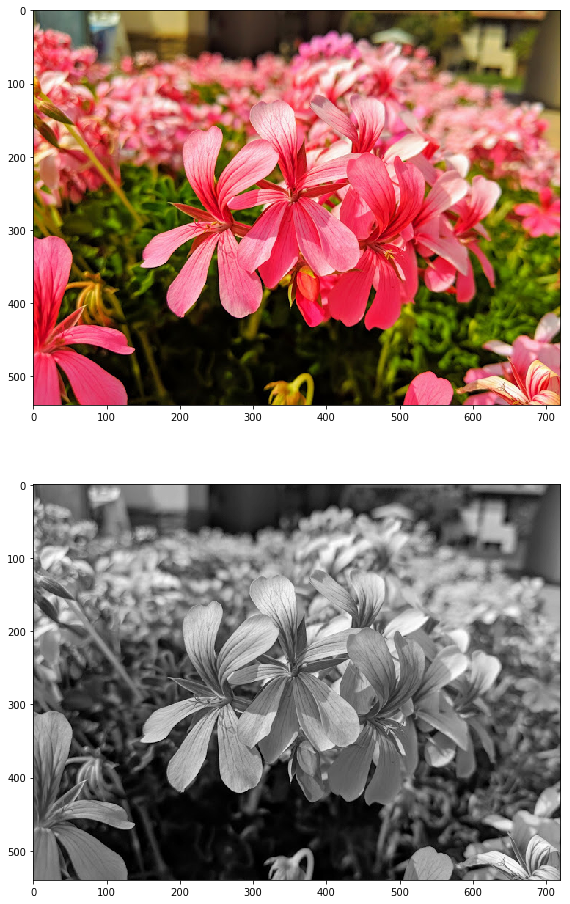

In [463]:
spring = imread('media/spring.jpg')
showInfo(spring)
subplot(211)
imshow(spring)

# spring_bw = sum(spring, axis = 2) / (spring.shape[2] * 255)
spring_bw = rgb2gray(spring) / 255
showInfo(spring_bw)
subplot(212)
imshow(spring_bw, cmap=cm.gray);

(540, 720, 3) float64 max = 1.0
(540, 720, 3) float64 max = 1.0


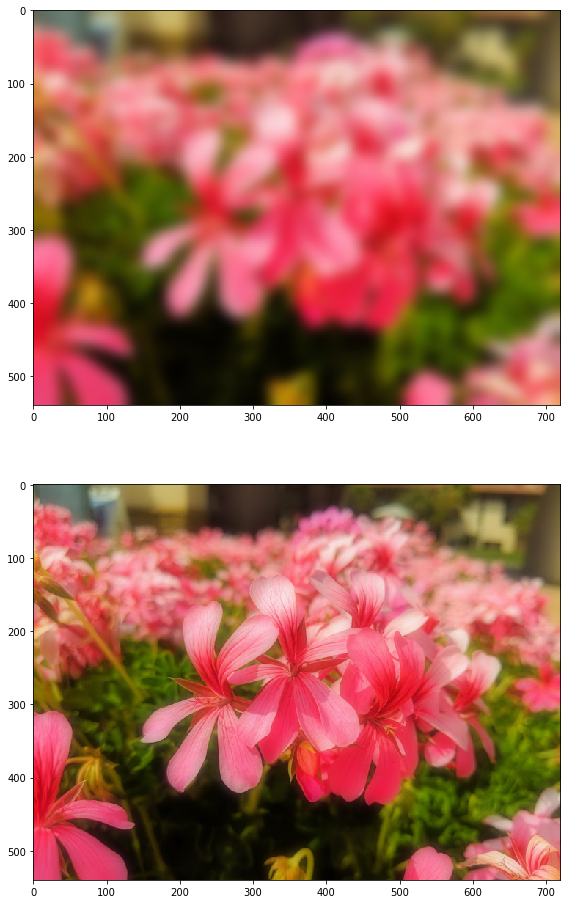

In [563]:
import scipy.ndimage as ndimage

spring_gaussian = ndimage.gaussian_filter(spring,(9,9,0))
# using (3,3,0) so different kernal in each dimentnion
# spring_gaussian /= spring_gaussian.max() -- this doesn't work
spring_gaussian = spring_gaussian / spring_gaussian.max()
showInfo(spring_gaussian)
subplot(211)
imshow(spring_gaussian);

subplot(212)
spring_new_1 = (spring / spring.max() + spring_gaussian) / 2.0
showInfo(spring_new_1)
imshow(spring_new_1);

# why the weird result?

(540, 720) float64 max = 0.028035431776471522
(540, 720) float64 max = 1.0
(540, 720) float64 max = 0.8883987248615286


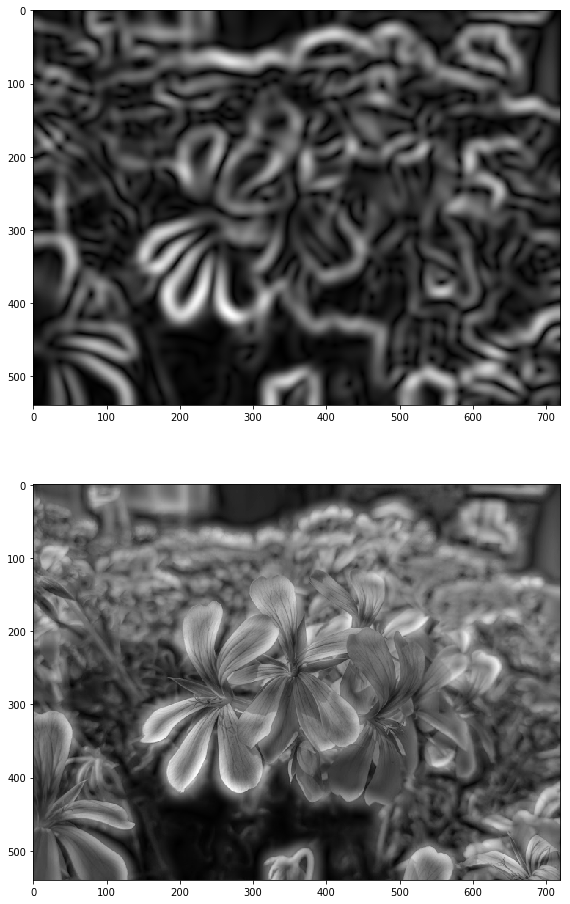

In [516]:
spring_g_gradient = ndimage.gaussian_gradient_magnitude(spring_bw,9)
showInfo(spring_g_gradient)
spring_g_gradient /= spring_g_gradient.max()
showInfo(spring_g_gradient)
subplot(211)
imshow(spring_g_gradient, cmap = cm.gray);

subplot(212)
spring_new_2 = (spring_bw + spring_g_gradient) / 2
showInfo(spring_new_2)
imshow(spring_new_2, cmap = cm.gray);

(540, 720, 3) float64 max = 1.0
(540, 720, 3) float64 max = 1.0


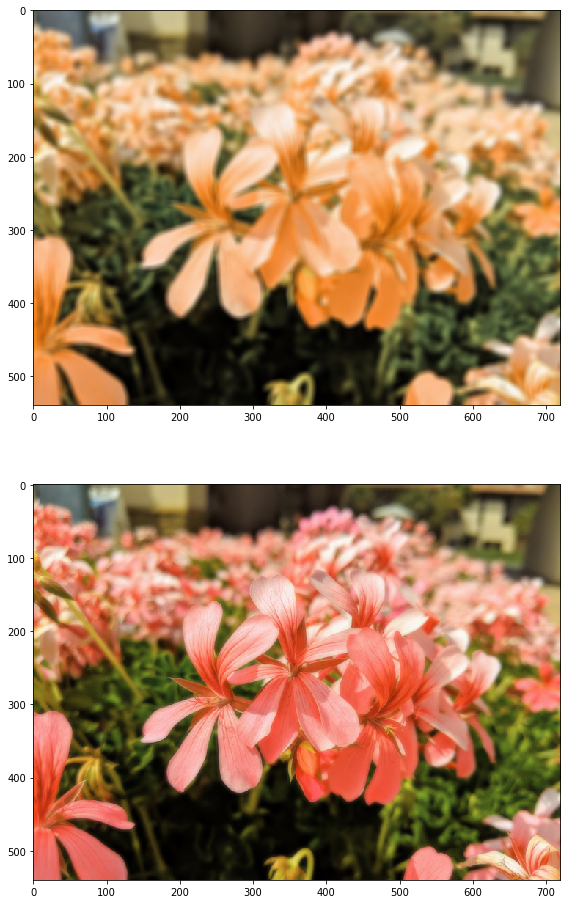

In [519]:
spring_uniform = ndimage.uniform_filter(spring,(9,9,2))
spring_uniform = spring_uniform / spring_uniform.max()
showInfo(spring_uniform)
subplot(211)
imshow(spring_uniform)

spring_new_3 = (spring_uniform + spring / 255.0) / 2.0
showInfo(spring_new_3)
subplot(212)
imshow(spring_new_3);

(540, 720, 3) float64 max = 1.0
(540, 720, 3) float64 max = 0.5
(540, 720, 3) float64 max = 1.0


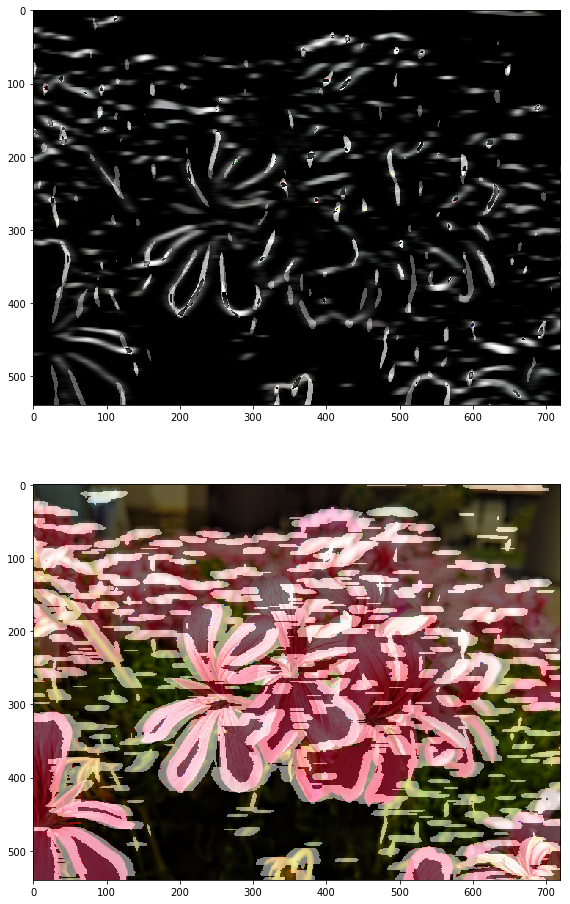

In [521]:
spring_g_laplace = ndimage.gaussian_laplace(spring,(5,5,3))
spring_laplace = spring_g_laplace / spring_g_laplace.max()
showInfo(spring_laplace)
subplot(211)
imshow(spring_g_laplace)

spring_laplace_2 = where(spring_g_laplace > 0.1, 0.5, 0)
showInfo(spring_laplace_2)

spring_new_4 = (spring_laplace_2 + spring / 510.0)
showInfo(spring_new_4)
subplot(212)
imshow(spring_new_4);

(540, 720) bool max = True
(540, 720) float64 max = 0.9990558823529412


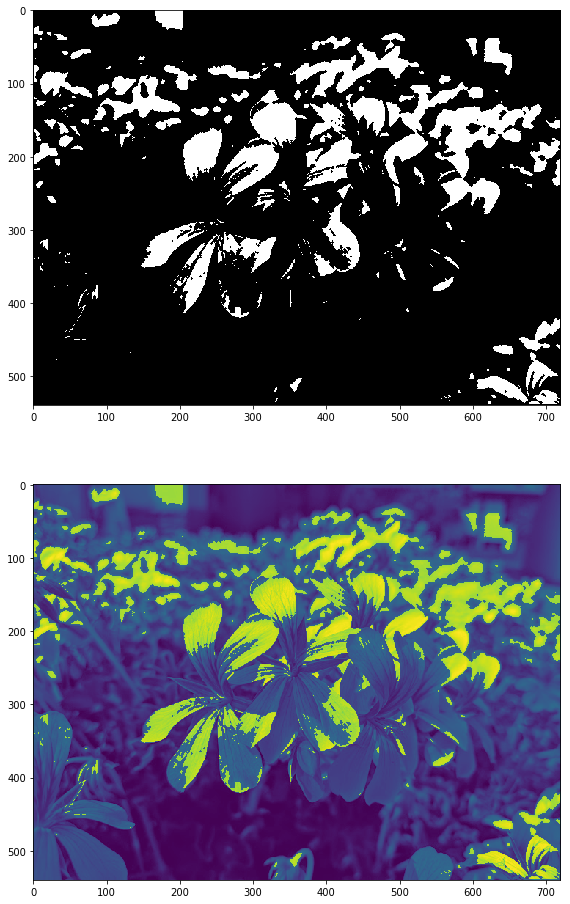

In [449]:
spring_binary = where(spring_bw > 0.7, 1, 0)
spring_closing = ndimage.binary_closing(spring_binary)
showInfo(spring_closing)
subplot(211)
imshow(spring_closing, cmap = cm.gray)

spring_new_5 = (spring_bw + spring_closing) / 2.0
showInfo(spring_new_5)
subplot(212)
imshow(spring_new_5);


(540, 720, 3) uint8 max = 255
(540, 720, 3) uint8 max = 255


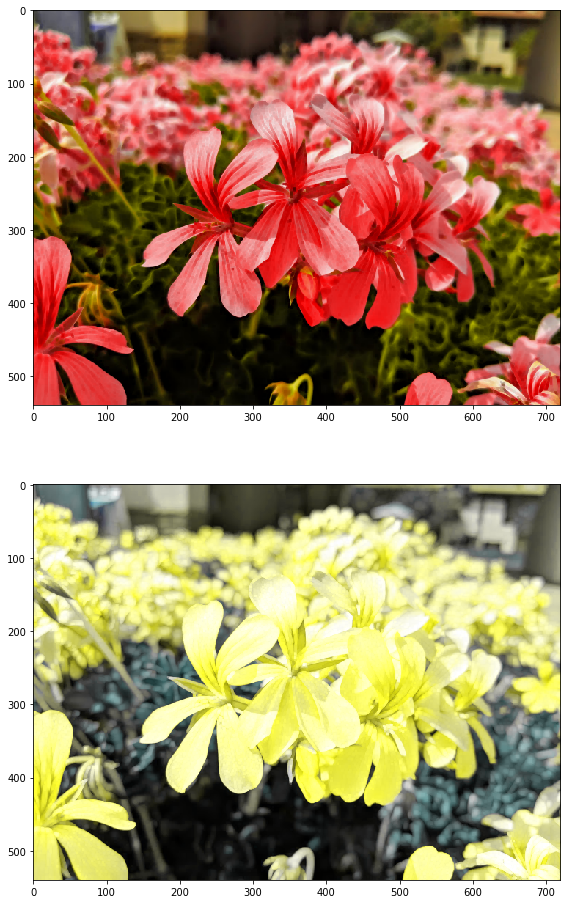

In [450]:
spring_minimum = ndimage.minimum_filter(spring, (3,3,2))
showInfo(spring_minimum)
subplot(211)
imshow(spring_minimum)

spring_maximum = ndimage.maximum_filter(spring, (3,3,2))
showInfo(spring_maximum)
subplot(212)
imshow(spring_maximum)

(540, 720, 3) float64 max = 1.0


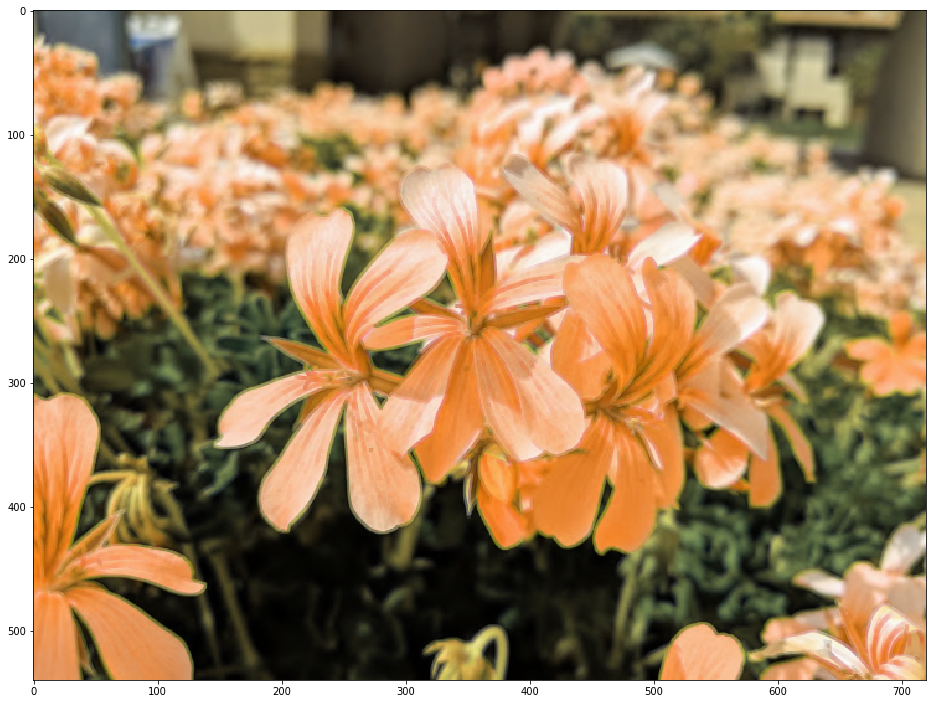

In [458]:
spring_new_6 = (spring_minimum / 2.0 + spring_maximum / 2.0)
spring_new_6 /= spring_new_6.max()
showInfo(spring_new_6)
imshow(spring_new_6);

(540, 720, 3) uint8 max = 255
(540, 720, 3) uint8 max = 255


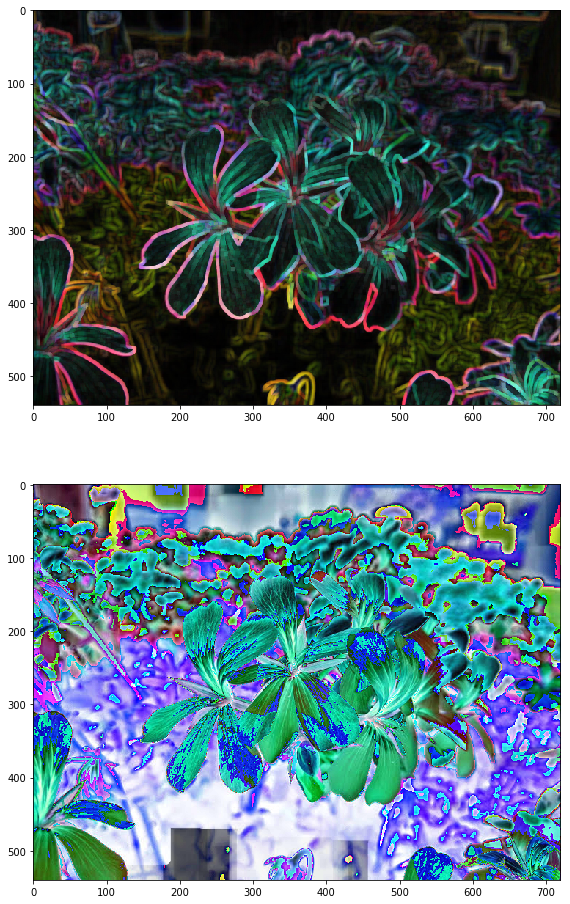

In [452]:
import scipy.ndimage.morphology as morphology

spring_gradient = morphology.morphological_gradient(spring, size=(5,5,0))
showInfo(spring_gradient)
subplot(211)
imshow(spring_gradient)

spring_laplace = morphology.morphological_laplace(spring, size=99)
showInfo(spring_laplace)
subplot(212)
imshow(spring_laplace);

(540, 720, 3) float64 max = 1.0


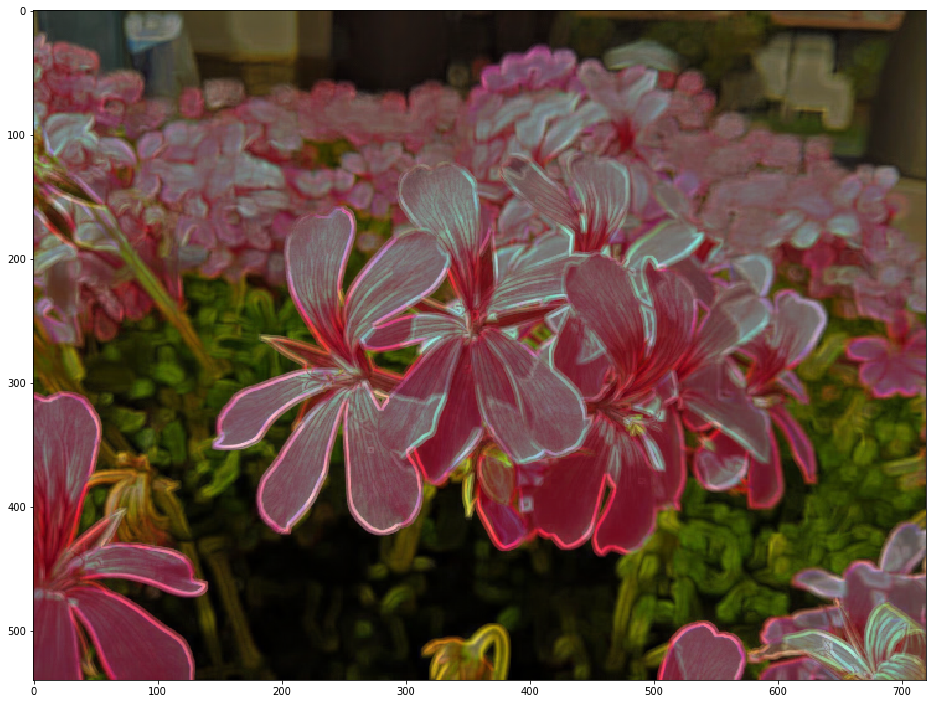

In [456]:
spring_new_7 = (spring / 300 + spring_gradient/ 255)
spring_new_7 /= spring_new_7.max()
showInfo(spring_new_7)
imshow(spring_new_7);

# HW4 image

(540, 720, 3) float64 max = 1.0


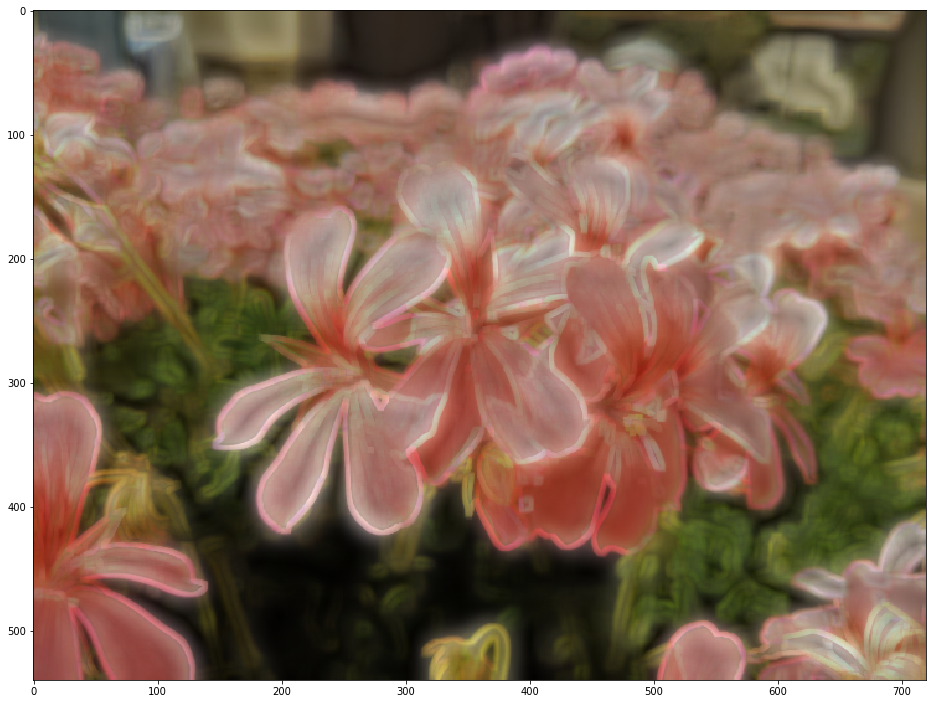

In [549]:
spring_ultimate = (spring_gaussian + spring_g_gradient.reshape(540,720,1) + spring_uniform + spring_gradient / 255)/4
spring_ultimate = spring_ultimate / spring_ultimate.max()
showInfo(spring_ultimate)
imshow(spring_ultimate);

/anaconda3/lib/python3.6/site-packages/skimage/exposure/exposure.py:63: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  warn("This might be a color image. The histogram will be "


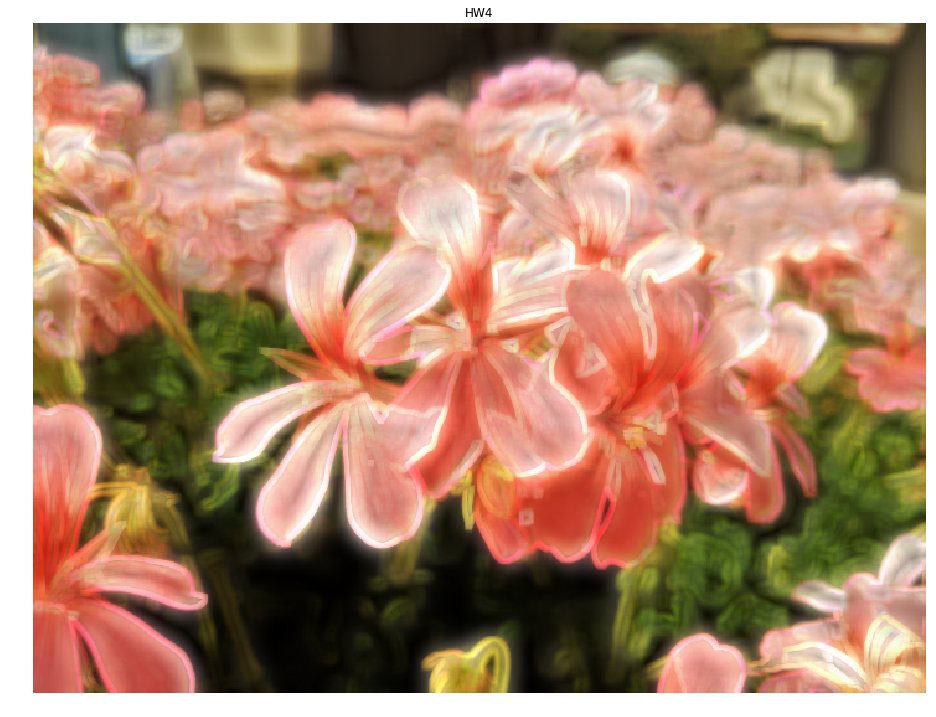

In [550]:
from skimage import exposure

img = spring_ultimate
# Adjust the contrast of the image by applying Histogram Equalization 
# spring_equalized = exposure.equalize_adapthist(img/np.max(np.abs(img)), clip_limit=0.03)

spring_equalized = exposure.equalize_hist(img)
plt.imshow(spring_equalized, cmap=plt.cm.gray)
plt.axis('off')
plt.title('HW4')
plt.show()

## other practice code

In [538]:
tmp = spring_new_5.reshape(540,720,1)

(540, 720, 3) float64 max = 1.9866062957713204


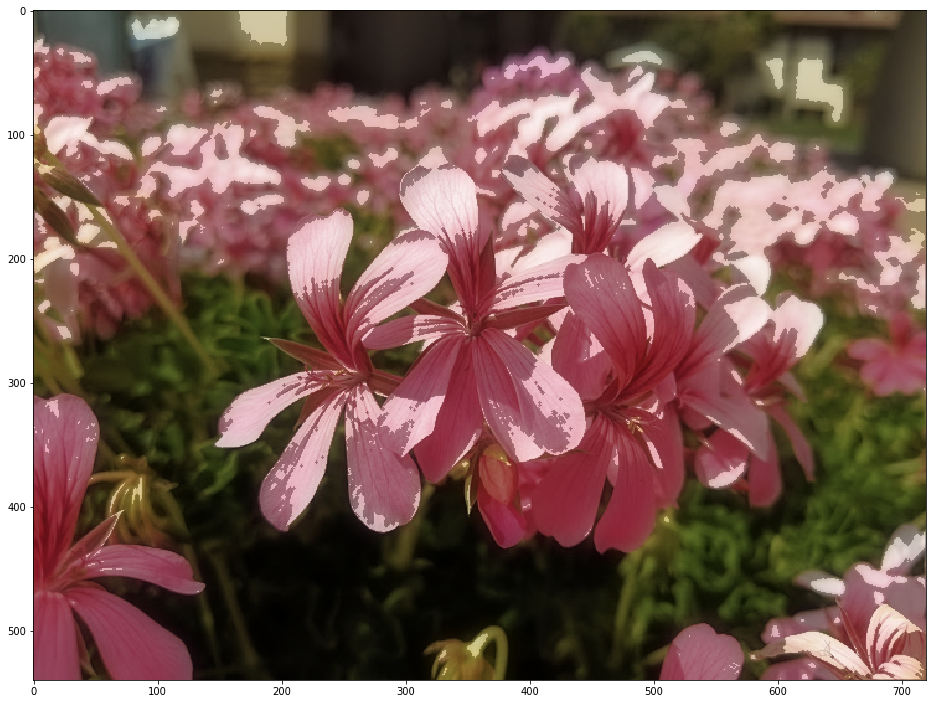

In [539]:
a = tmp + spring_new_1
showInfo(a)
imshow(a/2)

(530, 947, 3) uint8 max = 255


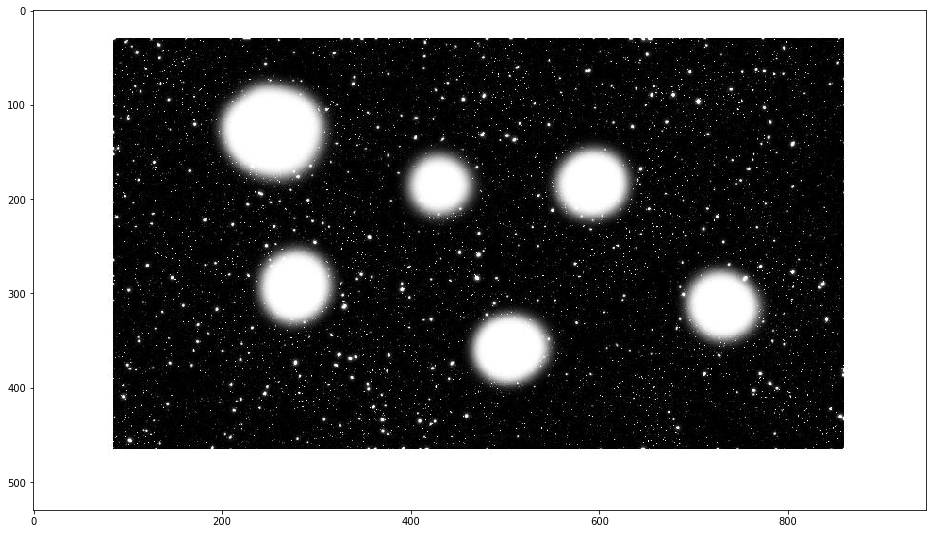

In [377]:
cosmos = imread("./media/Cosmos_original.jpg")
showInfo(cosmos)
imshow(cosmos);

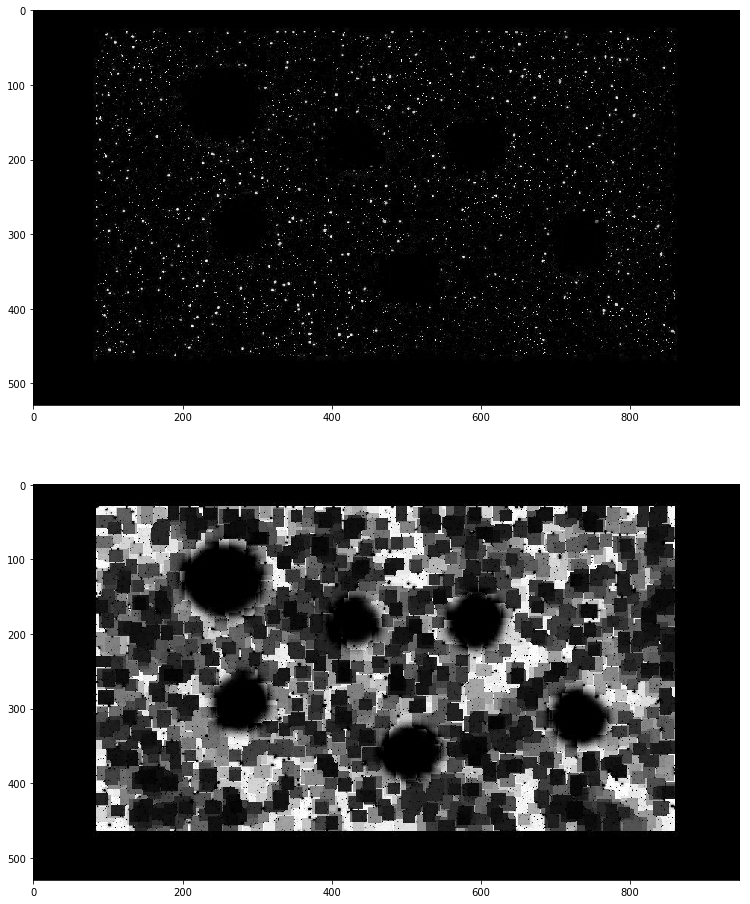

In [384]:
cosmos_white_tophat = ndimage.white_tophat(cosmos,5)
subplot(211)
imshow(cosmos_white_tophat)

cosmos_black_tophat = ndimage.black_tophat(cosmos,15)
subplot(212)
imshow(cosmos_black_tophat);


In [ ]:
spring_binary

In [412]:
from scipy.ndimage.filters import convolve as convolve2 
# renaming looks like this!

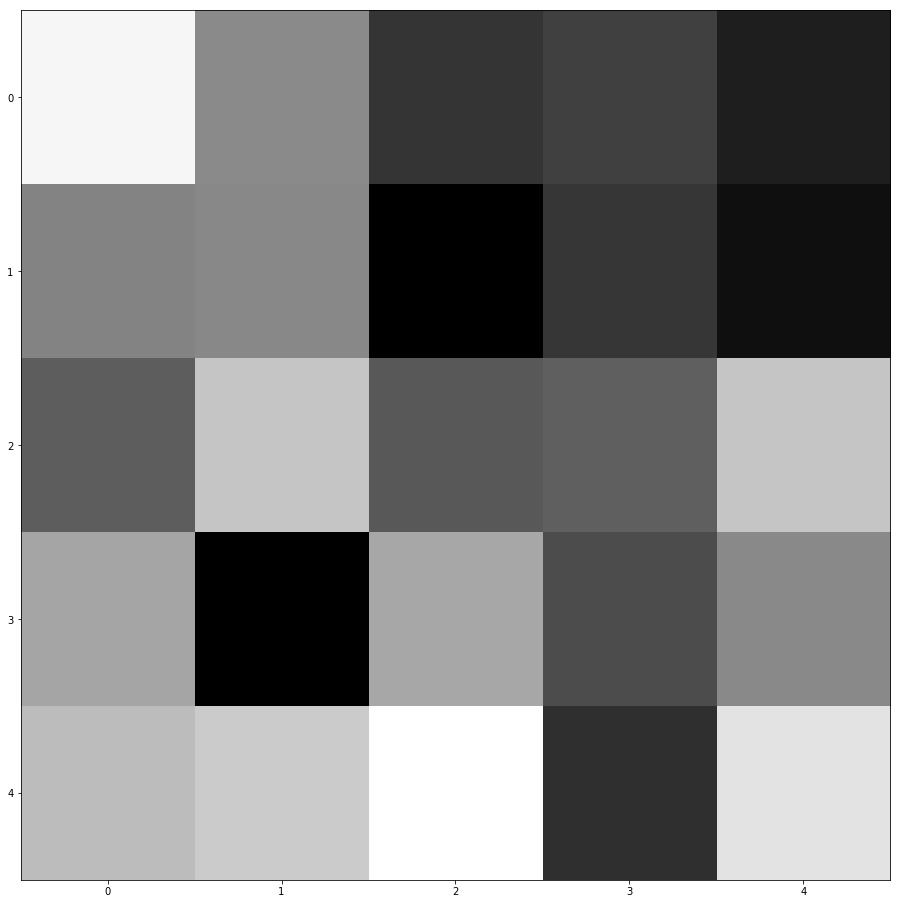

In [493]:
random_kernal = random.random((5,5))
# print(random_kernal)
imshow(random_kernal, cmap = cm.gray)

(540, 720) uint8 max = 255
(540, 720, 3) float64 max = 0.85


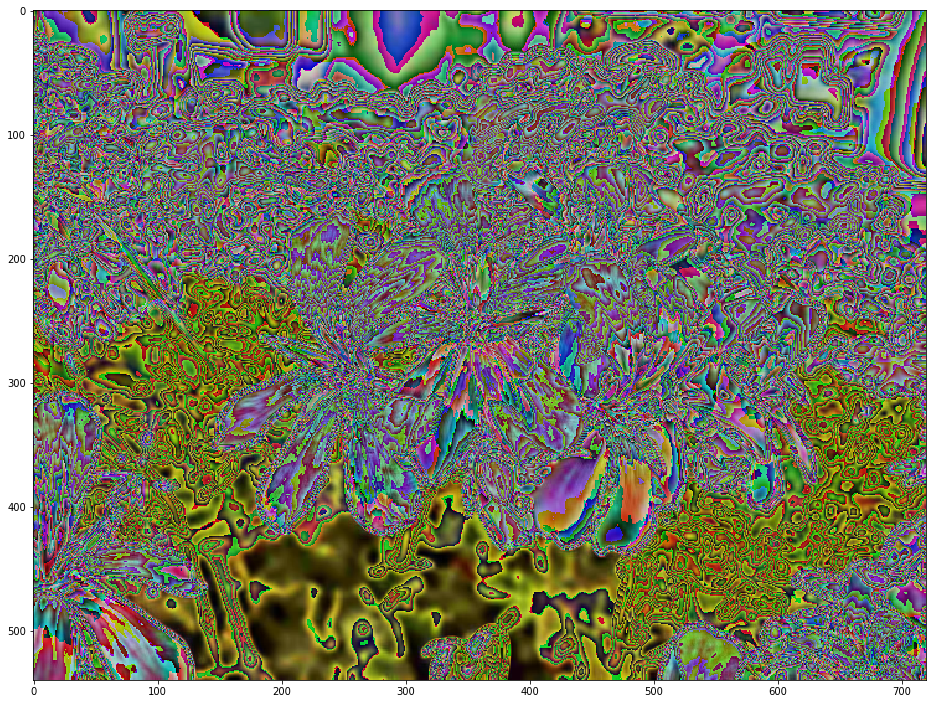

In [510]:
temp1 = convolve2(spring[:,:,0], random_kernal)
temp2 = convolve2(spring[:,:,1], random_kernal)
temp3 = convolve2(spring[:,:,2], random_kernal)
showInfo(temp1)
temppp = np.concatenate((temp1.reshape(540,720,1),temp2.reshape(540,720,1),temp3.reshape(540,720,1)), axis=2)
temppp = temppp / 300
showInfo(temppp)
imshow(temppp);

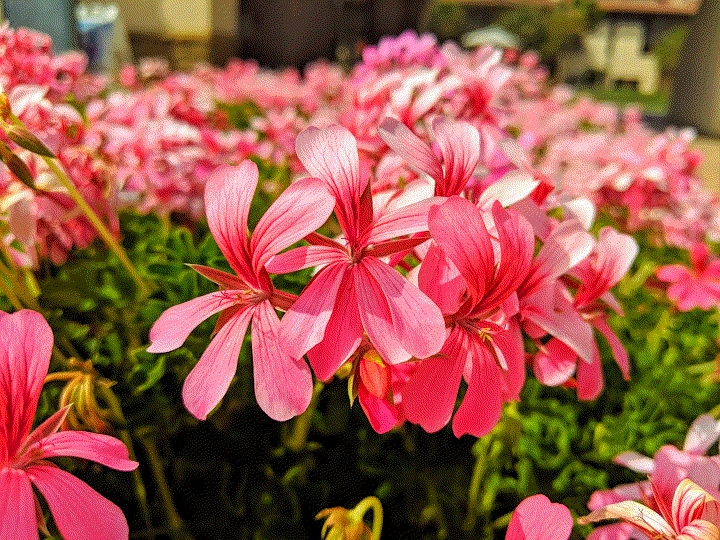

In [581]:
from PIL import Image
spring = Image.open('media/spring.jpg')
spring_8bit = spring.convert('P')

# spring_8bit.show()
spring_8bit

# ImagePalette

In [551]:
import numpy as np
np.__version__

'1.14.0'

In [552]:
!pip install numpy --upgrade

    100% |████████████████████████████████| 4.7MB 302kB/s ta 0:00:011
  Found existing installation: numpy 1.14.0
    Uninstalling numpy-1.14.0:
      Successfully uninstalled numpy-1.14.0
You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [553]:
import skimage
skimage.__version__

'0.13.1'